# Question 3: Object Identification

In [1]:
# Libraries
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import histogram_module # functions for histograms
import gauss_module # functions for gaussian filters
import dist_module # functions for compute distances

import glob # to load list of files
import pandas as pd
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import ParameterGrid # useful in implementig the grid search

In [2]:
# Functions

def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray



# model_images - list of file names of model images
# query_images - list of file names of query images
#
# dist_type - string which specifies distance type:  'chi2', 'l2', 'intersect'
# hist_type - string which specifies histogram type:  'grayvalue', 'dxdy', 'rgb', 'rg'
#
# note: use functions 'get_dist_by_name', 'get_hist_by_name' and 'is_grayvalue_hist' to obtain
#       handles to distance and histogram functions, and to find out whether histogram function
#       expects grayvalue or color image
# note: use functions compute_histograms to get from a list of file names of images a list of 
#       corresponding histograms

def find_best_match(model_images, query_images, dist_type, hist_type, num_bins):
    
    # whether histogram function expects grayvalue or color image
    hist_isgray = histogram_module.is_grayvalue_hist(hist_type)
    
    # form list of file images to list of histograms
    model_hists = compute_histograms(model_images, hist_type, hist_isgray, num_bins)
    query_hists = compute_histograms(query_images, hist_type, hist_isgray, num_bins)
    
    D = np.zeros((len(model_images), len(query_images))) # container for distances        
    best_match = [] # container for best match for each image
    
    for i in range(len(query_images)):
        Q = query_hists[i]
        for j in range(len(model_hists)):
            V = model_hists[j]
            dist = dist_module.get_dist_by_name(Q, V, dist_type) # distance between histogram 
            D[j, i] = dist # save distance measure in correct position
        idx = list(D[:, i]).index(min(D[:, i])) # find histogram with lower distance respect to the one in exam
        best_match.append(idx)

    return best_match, D



# Map each image in the list to the specified corresponding histogram and put the resulting histogram in a list
#
# image_list - list which specifies file names of images
# hist_type - string which specifies histogram type:  'grayvalue', 'dxdy', 'rgb', 'rg'
# hist_isgray - boolean which specifies whether histogram function expects grayvalue or color image
#
# note: use function single_hist_maker to get for each image the corresponding histogram

def compute_histograms(image_list, hist_type, hist_isgray, num_bins):

    image_hist = list(map(lambda x: single_hist_maker(x, hist_type, hist_isgray, num_bins), np.array(image_list)))
    
    return image_hist



# Given an image file it returns the specified corresponing histogram
#
# img - file name of an image
# hist_type - string which specifies histogram type:  'grayvalue', 'dxdy', 'rgb', 'rg'
# hist_isgray - boolean which specifies whether histogram function expects grayvalue or color image

def single_hist_maker(img, hist_type, hist_isgray, num_bins):
    # Gray or colored image
    if hist_isgray == True:
        img = rgb2gray(np.array(Image.open(img)))
    else:
        img = np.array(Image.open(img))
    # Histogram type
    return histogram_module.get_hist_by_name(np.array(img, float), num_bins, hist_type)



# For each image file from 'query_images' find and visualize the 5 nearest images from 'model_image'.
#
# Note: use the previously implemented function 'find_best_match'
# Note: use subplot command to show all the images in the same Python figure, one row per query image

def show_neighbors(model_images, query_images, dist_type, hist_type, num_bins):
    
    num_nearest = 5  # show the top-5 neighbors    
    best_match, D = find_best_match(model_images, query_images, dist_type, hist_type, num_bins)
    
    for i in range(len(query_images)):
        
        # sort distances of images and retrive index of the num_nearest (i.e. 5) with lower distances
        closest = sorted(range(len(D[:, i])), key=lambda k: D[:, i][k])[:num_nearest]
        
        # Plot
        for j in range(1, num_nearest+2):
            
            # general specifications for plot
            plt.figure(num_nearest+1, figsize=(20, 20))
            # subplot command to show num_nearest best images in the same row 
            ax = plt.subplot(1, num_nearest+1, j) 
            ax.title.set_size(25)
            plt.axis('off')
            plt.sca(ax)
            
            if j == 1: # the first image is the query image
                ax.title.set_text('Q'+str(i))
                plt.imshow(np.array(Image.open(query_images[i])))
            else:
                # plot best matches with corresponding distances
                ax.title.set_text('M'+str(round(D[closest[j-2], i], 4))) 
                plt.imshow(np.array(Image.open(model_images[closest[j-2]])))       
        plt.show()
        
    return None   



# Given a distance measure and a histogram type compute over a set of query image the recognition rate.
# The recognition rate is is given by a ratio between number of correct matches and total number of query images.
#
# model_images - list of file names of model images
# query_images - list of file names of some query images
# all_query - list of file names of all query images (it is needed to check wheter the match is correct or not)
#
# dist_type - string which specifies distance type:  'chi2', 'l2', 'intersect'
# hist_type - string which specifies histogram type:  'grayvalue', 'dxdy', 'rgb', 'rg'
#
# note: use the previously implemented function 'find_best_match' to find best match.

def recognition_rate(model_images, query_images, all_query, dist_type, hist_type, num_bins):
    best_match, D = find_best_match(model_images, query_images, dist_type, hist_type, num_bins)
    correct = 0
    for i in range(len(best_match)):
        if query_images[i] == all_query[best_match[i]]:
            correct += 1
        else:
            pass
    return correct/len(query_images)



# Find recognition rate for each combination of distance/histogram function and number of bins
#
# hyper_grid - dictionaty in which key -> hyperparameters, value -> list of values for that hyperparameter
# model_images - list of file names of model images
# query_images - list of file names of some query images
# all_query - list of file names of all query images (it is needed to check wheter the match is correct or not)

def grid_search(hyper_grid, model_images, query_images, all_query):
    
    grid = ParameterGrid(hyper_grid) 
    all_res = []
    for hypers in tqdm(grid):
        
        # Combinations
        dist_type = hypers['dist_type']
        hist_type = hypers['hist_type']
        num_bins = hypers['num_bins']
        hyperparams = [dist_type, hist_type, num_bins]
        
        # Compute recognition rate
        rate = recognition_rate(model_images, query_images, all_query, dist_type, hist_type, num_bins)
        
        # Save results
        all_res.append({'hyperparameters': hyperparams,'recognition_rate': rate})
        
    out = pd.DataFrame(all_res)
    out.to_csv('recognition_rates.csv', index=False)
    
    return print('File created grid_search')


In [3]:
# Load data 
query = glob.glob(".\query\*.png") # list of file names of query images
model = glob.glob(".\model\*.png") # list of file names of model images

## a)
Having implemented different distance functions and image histograms, we can now test how suitable
they are for retrieving images in query-by-example scenario. Implement a function find best match, in
match module.py, which takes a list of model images and a list of query images and for each query im-
age returns the index of closest model image. The function should take string parameters, which identify
distance function, histogram function and number of histogram bins. See comments in the beginning of
find best match for more details. Additionally to the indices of the best matching images your implemen-
tation should also return a matrix which contains distances between all pairs of model and query images.

In [4]:
# Example, we use as distance function 'intersect' and as histogram function a 'rgb'
best_match, D = find_best_match(model, query, 'intersect', 'rgb', 10)

In [6]:
print(D)

[[0.11260986 0.55230713 0.43670654 ... 0.9083252  0.91003418 0.59020996]
 [0.46728516 0.14898682 0.51403809 ... 0.88519287 0.87738037 0.35998535]
 [0.39135742 0.60559082 0.0970459  ... 0.92822266 0.88153076 0.62109375]
 ...
 [0.94805908 0.9331665  0.98284912 ... 0.20513916 0.46484375 0.87036133]
 [0.92907715 0.89459229 0.91656494 ... 0.440979   0.24224854 0.82250977]
 [0.58453369 0.30688477 0.63201904 ... 0.8739624  0.85668945 0.23284912]]


In [8]:
print(best_match)

[0, 1, 2, 67, 4, 5, 31, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 31, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 55, 3, 36, 37, 38, 39, 40, 41, 42, 43, 47, 45, 3, 47, 48, 49, 30, 51, 9, 53, 54, 55, 56, 57, 58, 59, 60, 85, 30, 63, 30, 65, 66, 3, 68, 69, 70, 71, 72, 73, 74, 36, 76, 86, 58, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]


# b) 
Implement a function show neighbors (in match module.py) which takes a list of model images and a list of
query images and for each query image visualizes several model images which are closest to the query image
according to the specified distance metric. Use the function find best match in your implementation.

<Figure size 432x288 with 0 Axes>

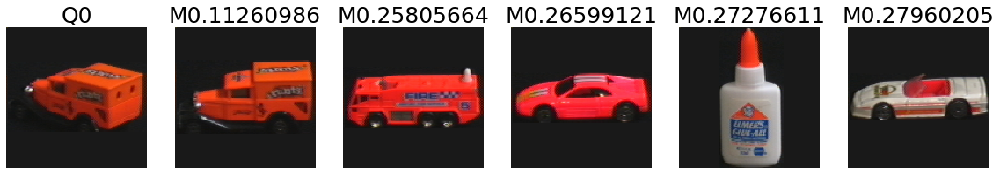

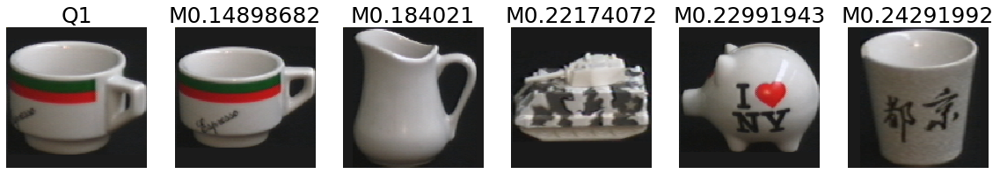

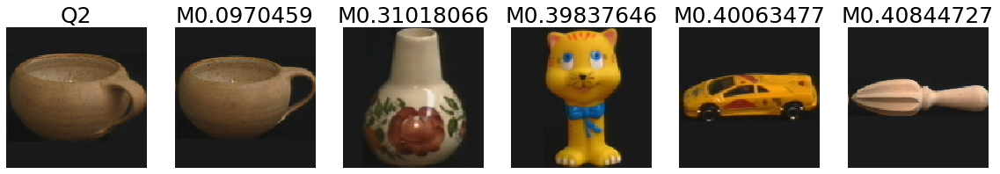

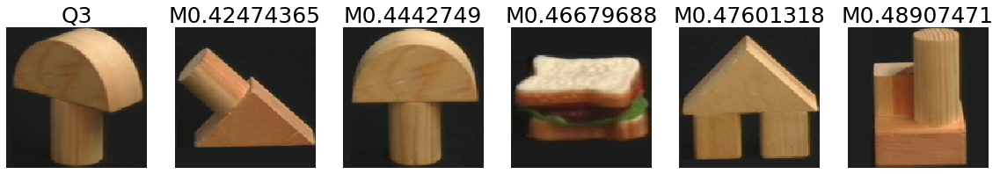

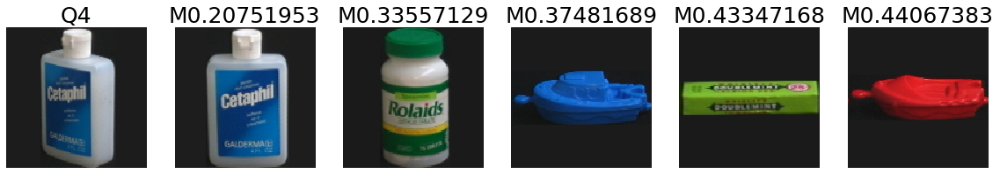

...

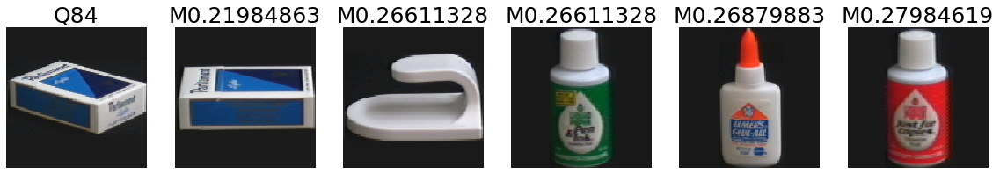

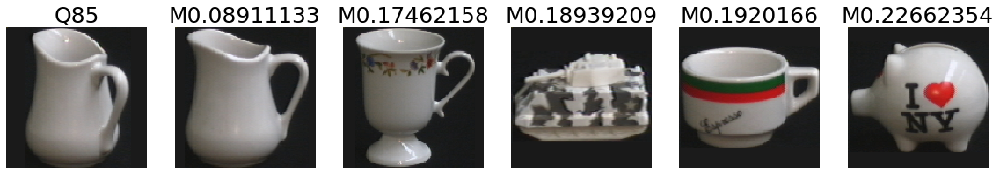

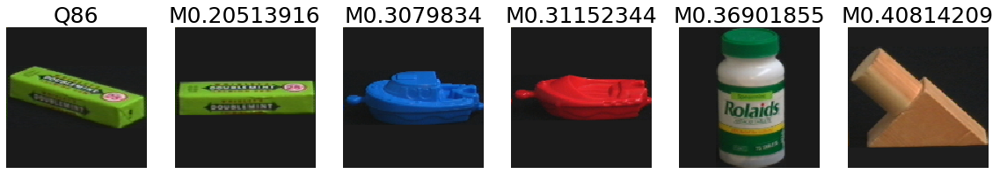

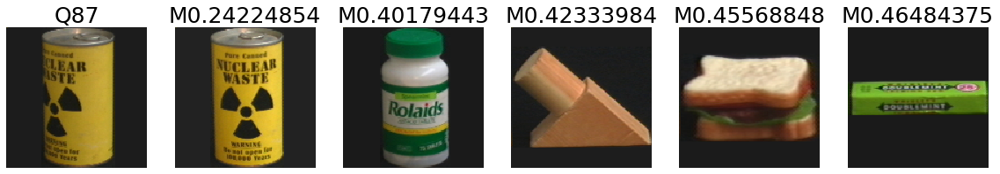

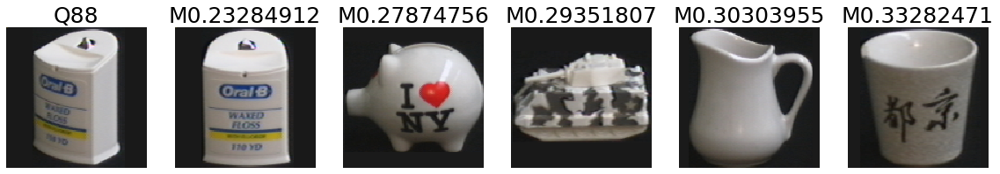

In [9]:
# Example, we use as distance function 'intersect' and as histogram function a 'rgb'
show_neighbors(model, query, 'intersect', 'rgb', 10)

# c) 
Use the function find best match to compute recognition rate for different combinations of distance and
histogram functions. The recognition rate is given by a ratio between number of correct matches and total
number of query images. Experiment with different functions and numbers of histogram bins, try to find
combination that works best. Submit the summary of your experiments in a report as part of your solution.

In [10]:
# Compute recognition rate using as distance function 'intersect' and as histogram function 
# a 'rgb' and 10 histogram bins

recognition_rate(model, query, query, 'intersect', 'rgb', 10)

0.8202247191011236

In [11]:
# Different combinations used for distance functions, histogram functions and number of bins
hyper_grid_cv = {'dist_type':['intersect', 'chi2', 'l2'], 'hist_type':['grayvalue', 'rgb', 'rg', 'dxdy'], 
                 'num_bins':[5, 10, 20, 50]}

# Find recognition rate for each combination
grid_search(hyper_grid_cv, model, query, query)

# Show results
rec_rate = pd.read_csv('recognition_rates.csv')
rec_rate.sort_values('recognition_rate', ascending=False)

,hyperparameters,recognition_rate
24,"['chi2', 'rg', 5]",1.000000
16,"['chi2', 'grayvalue', 5]",1.000000
31,"['chi2', 'dxdy', 50]",1.000000
30,"['chi2', 'dxdy', 20]",1.000000
29,"['chi2', 'dxdy', 10]",1.000000
28,"['chi2', 'dxdy', 5]",1.000000
27,"['chi2', 'rg', 50]",1.000000
26,"['chi2', 'rg', 20]",1.000000
25,"['chi2', 'rg', 10]",1.000000
23,"['chi2', 'rgb', 50]",1.000000
